In [309]:
#DATASET="rec_mu2e.CRV_wideband_cosmics-noadc.CRVWB-006_014.root"
DATASET="rec_mu2e.CRV_wideband_cosmics-noadc.CRVWB-007ext.root"

In [320]:
from mu2etools import wideband
from mu2etools import *

processor = wideband.DataProcessor(fixtimes=True)
ar = processor.getData(DATASET, max_workers=10, step_size="10GB", nfiles=-1)

Processing file: rec.mu2e.CRV_wideband_cosmics-noadc.CRVWB-000-011-000.002048_009.root - 100.0% complete

In [321]:
list_febID = ar['febID'].to_list()
FEBID = min(list_febID, key=lambda x: len(x))

NFEBS=len(FEBID)
print("Dataset: %s"%DATASET)
print("Number of FEBs: %d"%NFEBS)
print("List of FEBs: %s"%FEBID)

Dataset: rec_mu2e.CRV_wideband_cosmics-noadc.CRVWB-007ext.root
Number of FEBs: 6
List of FEBs: [25, 17, 22, 14, 20, 1]


In [322]:
for var in ['PEs', 'PEsTemperatureCorrected', 'calibConstants', 'calibConstantsTemperatureCorrected', 
            'biasVoltagesAvg', 'febID', 'meanTemperatures', 'signalsTemperatureCorrected', 'FWHMs', 'FWHMsTemperatureCorrected',
            'chi2s', 'chi2sTemperatureCorrected'
           ]:
    # Use only first common FEBs 
    ar[var] = ar[var][:, :NFEBS]
    # Converts arrays from variable-length dimensions to fixed-length dimensions explicitly 
    ar[var] = ak.to_regular(ar[var], axis=1)

In [323]:
# Get indices sorted by 'runNumber'
sorted_indices = ak.argsort(ar['runNumber'])
# Apply sorting to entire array
ar = ar[sorted_indices]

In [324]:
cut = (ar['timestamp'] > 0)
median_b = np.median(ar['biasVoltagesAvg'][cut], axis=0)
cut1 = np.abs(ar['biasVoltagesAvg'][cut] - median_b) < 0.05
cut2 = np.all(np.all(cut1, axis=1), axis=1)
ar_ = ar[cut2]

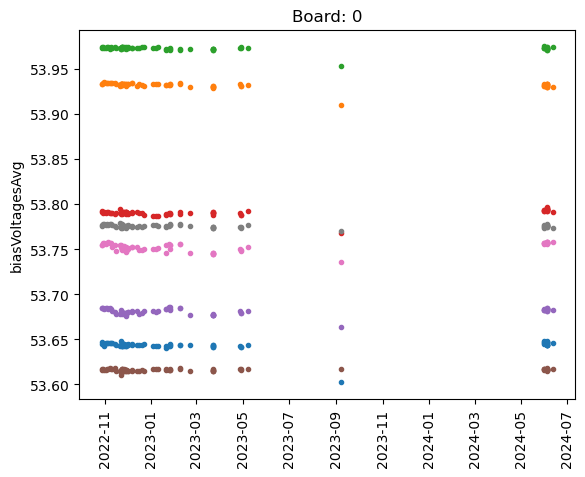

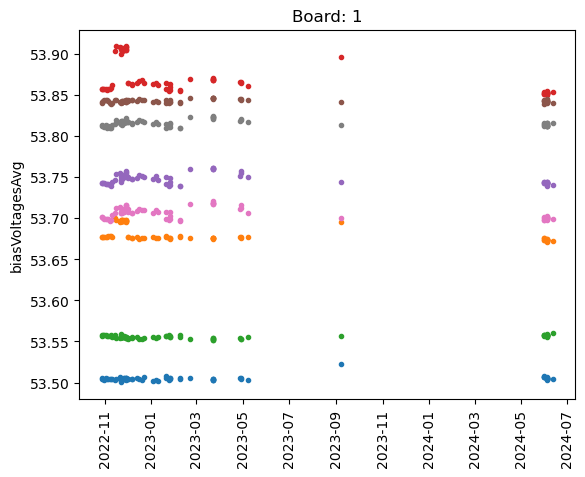

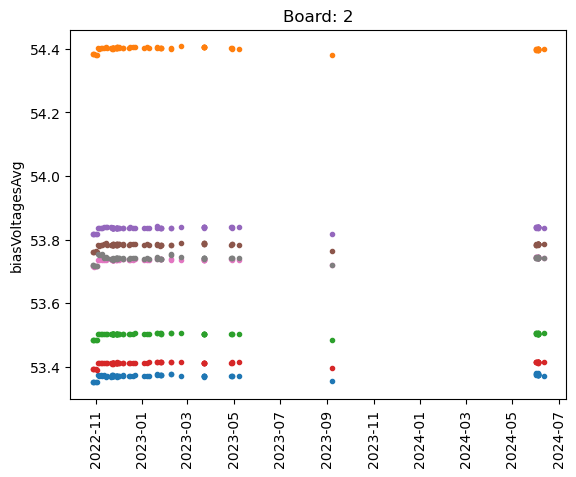

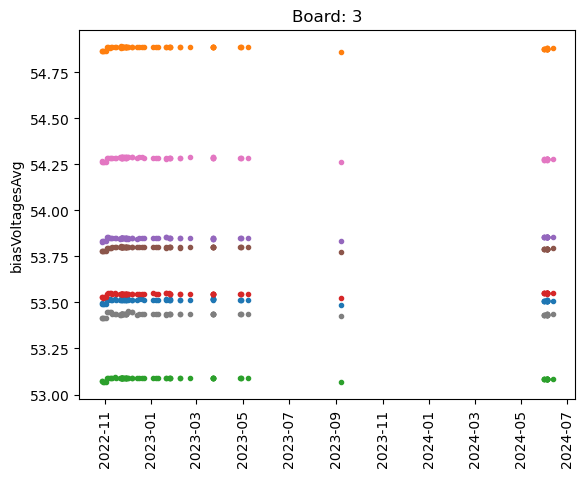

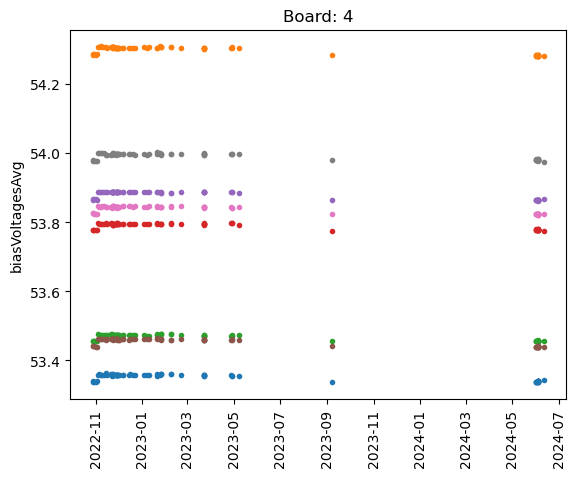

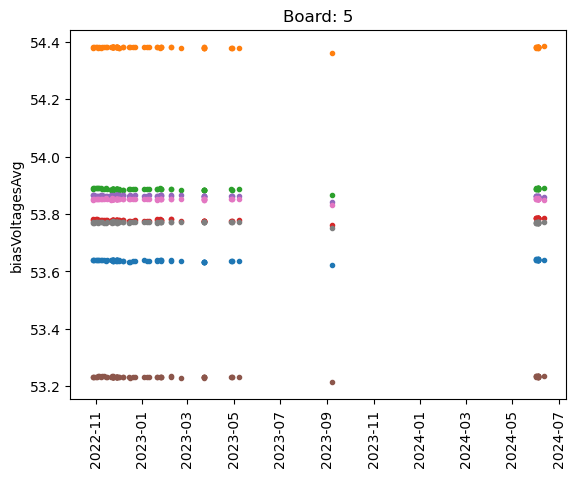

In [325]:
for board in range(6):
    plt.figure()
    x = ar_['timestamp'].to_numpy()
    y = ar_['biasVoltagesAvg'][:, board, :].to_numpy()
    
    plt.plot(x.astype('datetime64[s]'), y, '.')
    plt.xticks(rotation=90)
    # plt.ylim(10, 30)
    plt.ylabel('biasVoltagesAvg')
    plt.title("Board: %d" % board)

#    y=2*ar["meanTemperatures", cut][:,1,0].to_numpy()
#    plt.plot(x.astype('datetime64[s]'), y, 'bo', label='Temp [C]')


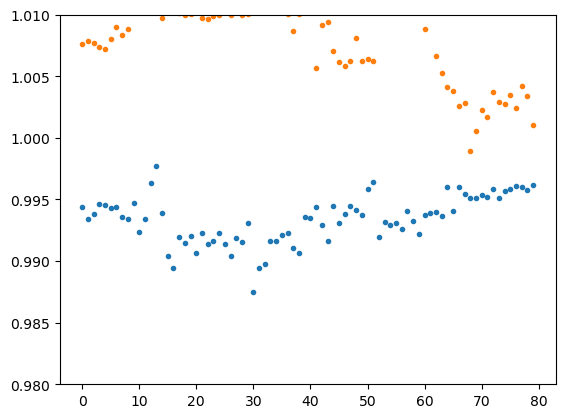

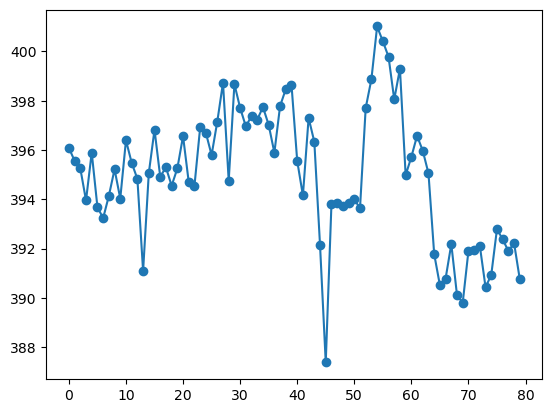

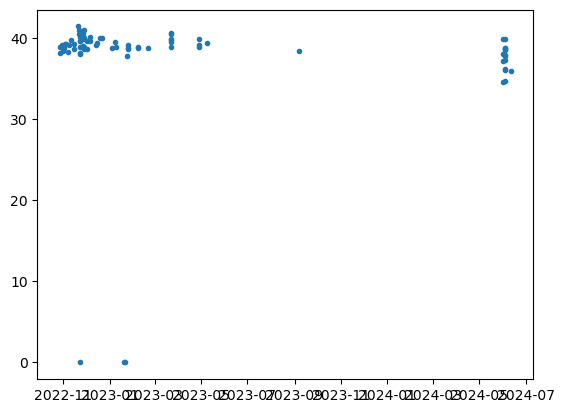

In [326]:
plt.plot(ar_['meanTemperatures'][:,2,24]/ar_['meanTemperatures'][:,2,28], '.')
plt.plot(ar_['meanTemperatures'][:,2,0]/ar_['meanTemperatures'][:,2,8], '.')
plt.ylim(0.98, 1.01)
plt.figure()
plt.plot(ar_['calibConstantsTemperatureCorrected'][:,2,24], '-o')
plt.figure()
x = ar_['timestamp'].to_numpy()
plt.plot(x.astype('datetime64[s]'), ar_['PEsTemperatureCorrected'][:,2,24], '.', label='Calib Corr Constants')


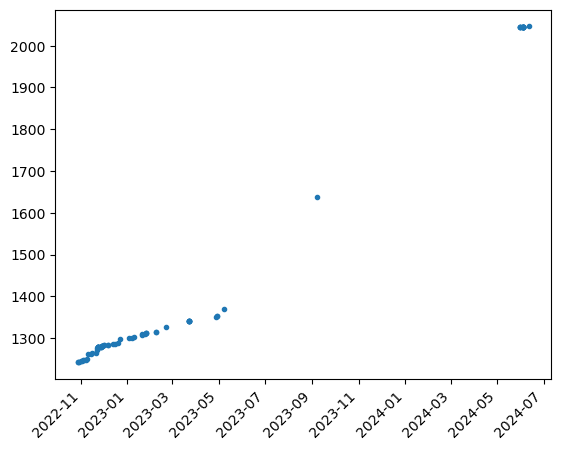

In [327]:
x = ar_['timestamp'].to_numpy()
plt.plot(x.astype('datetime64[s]'), ar_['runNumber'], '.')
plt.xticks(rotation=45, ha='right');
#plt.ylim(2000,)

Aging (uncorrected - all):    -2.79%/yr
Aging (uncorrected < 2130):  -2.79%/yr
Aging (corrected - all):     -2.68%/yr
Aging (corrected < 2130):    -2.68%/yr
Median Calib Constant:       389.9240


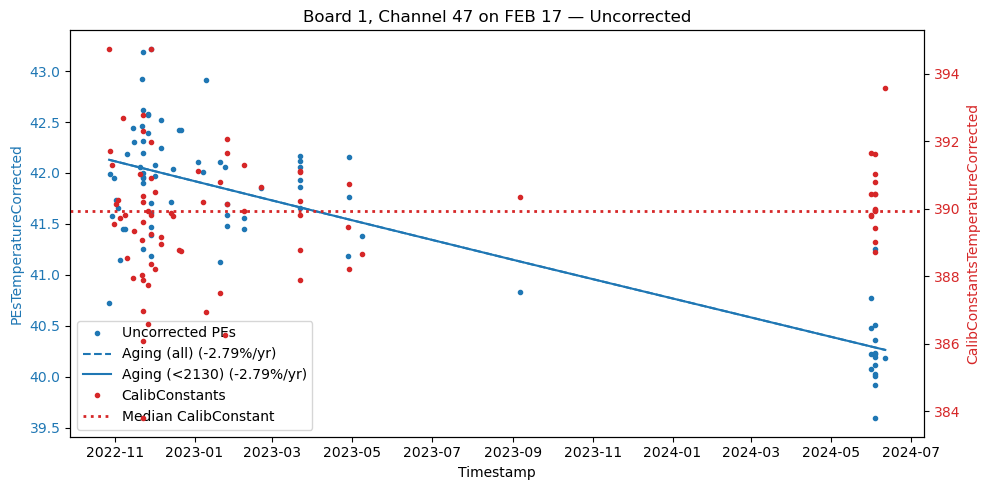

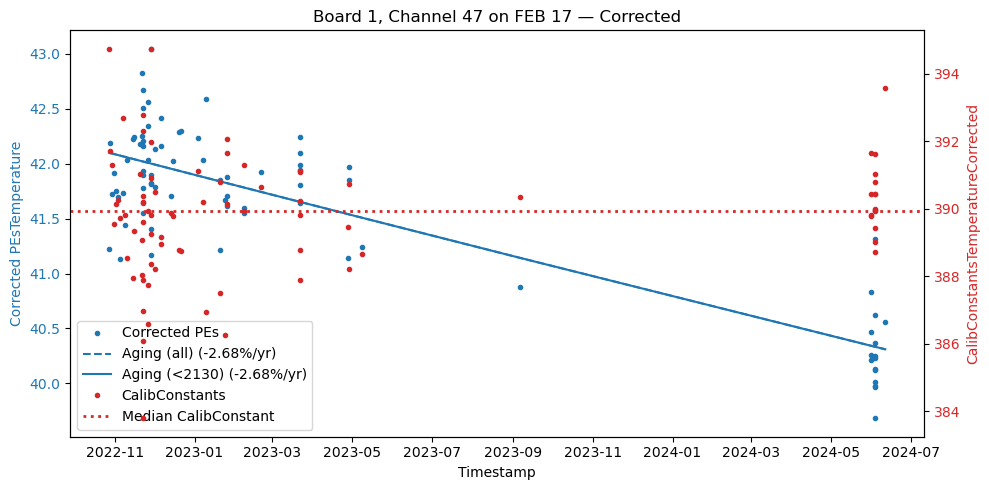

In [328]:
import numpy as np
import matplotlib.pyplot as plt
import awkward as ak

# --- Configuration ---
board = 1
channel = 47

# Extract data
x = ar_['timestamp'].to_numpy()
y_pe = ar_['PEsTemperatureCorrected'][:, board, channel].to_numpy()
y_calib = ar_['calibConstantsTemperatureCorrected'][:, board, channel].to_numpy()
run_numbers = ar_['runNumber'].to_numpy()
feb_ids = ar_['febID'][:, board].to_numpy()

# === Remove entries with zero values ===
valid_mask = (y_pe > 0) & (y_calib > 0)
x = x[valid_mask]
y_pe = y_pe[valid_mask]
y_calib = y_calib[valid_mask]
run_numbers = run_numbers[valid_mask]
feb_ids = feb_ids[valid_mask]

# Use representative FEB ID
feb_id_display = feb_ids[0] if isinstance(feb_ids[0], (int, np.integer)) else np.unique(feb_ids)[0]

# === Apply calibration correction ===
median_calib = np.median(y_calib)
correction_factor = median_calib / y_calib
y_pe_corrected = y_pe / correction_factor

# Reference time for fitting
x0 = x[0]

# === Fit: Uncorrected (full) ===
log_y_uncorr = np.log(y_pe)
fit_params_uncorr = np.polyfit(x - x0, log_y_uncorr, 1)
B_uncorr, log_A_uncorr = fit_params_uncorr
A_uncorr = np.exp(log_A_uncorr)
exp_fn_uncorr = lambda t: A_uncorr * np.exp(B_uncorr * (t - x0))
rate_uncorr = B_uncorr * 3.154e7 * 100
label_uncorr = f"Aging (all) ({rate_uncorr:.2f}%/yr)"

# === Fit: Corrected (full) ===
log_y_corr = np.log(y_pe_corrected)
fit_params_corr = np.polyfit(x - x0, log_y_corr, 1)
B_corr, log_A_corr = fit_params_corr
A_corr = np.exp(log_A_corr)
exp_fn_corr = lambda t: A_corr * np.exp(B_corr * (t - x0))
rate_corr = B_corr * 3.154e7 * 100
label_corr = f"Aging (all) ({rate_corr:.2f}%/yr)"

# === Fit: Partial (runNumber < 2130) ===
mask = run_numbers < 2130
x_partial = x[mask]
y_uncorr_partial = y_pe[mask]
y_corr_partial = y_pe_corrected[mask]

# Partial fit: uncorrected
log_y_partial_uncorr = np.log(y_uncorr_partial)
Bp_uncorr, log_Ap_uncorr = np.polyfit(x_partial - x0, log_y_partial_uncorr, 1)
Ap_uncorr = np.exp(log_Ap_uncorr)
exp_fn_partial_uncorr = lambda t: Ap_uncorr * np.exp(Bp_uncorr * (t - x0))
rate_partial_uncorr = Bp_uncorr * 3.154e7 * 100
label_partial_uncorr = f"Aging (<2130) ({rate_partial_uncorr:.2f}%/yr)"

# Partial fit: corrected
log_y_partial_corr = np.log(y_corr_partial)
Bp_corr, log_Ap_corr = np.polyfit(x_partial - x0, log_y_partial_corr, 1)
Ap_corr = np.exp(log_Ap_corr)
exp_fn_partial_corr = lambda t: Ap_corr * np.exp(Bp_corr * (t - x0))
rate_partial_corr = Bp_corr * 3.154e7 * 100
label_partial_corr = f"Aging (<2130) ({rate_partial_corr:.2f}%/yr)"

# === Plot: Uncorrected ===
fig1, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(x.astype('datetime64[s]'), y_pe, '.', color='tab:blue', label='Uncorrected PEs')
ax1.plot(x.astype('datetime64[s]'), exp_fn_uncorr(x), '--', color='tab:blue', label=label_uncorr)
ax1.plot(x_partial.astype('datetime64[s]'), exp_fn_partial_uncorr(x_partial), '-', color='tab:blue', label=label_partial_uncorr)

ax1.set_ylabel("PEsTemperatureCorrected", color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Calibration constants (secondary axis)
ax1b = ax1.twinx()
ax1b.plot(x.astype('datetime64[s]'), y_calib, '.', color='tab:red', label='CalibConstants')
ax1b.axhline(median_calib, color='tab:red', linestyle=':', linewidth=2, label='Median CalibConstant')
ax1b.set_ylabel("CalibConstantsTemperatureCorrected", color='tab:red')
ax1b.tick_params(axis='y', labelcolor='tab:red')

title = f"Board {board}, Channel {channel} on FEB {feb_id_display}"
ax1.set_title(f"{title} — Uncorrected")
ax1.set_xlabel("Timestamp")
plt.xticks(rotation=45, ha='right')
fig1.tight_layout()

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax1b.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

# === Plot: Corrected ===
fig2, ax2 = plt.subplots(figsize=(10, 5))

ax2.plot(x.astype('datetime64[s]'), y_pe_corrected, '.', color='tab:blue', label='Corrected PEs')
ax2.plot(x.astype('datetime64[s]'), exp_fn_corr(x), '--', color='tab:blue', label=label_corr)
ax2.plot(x_partial.astype('datetime64[s]'), exp_fn_partial_corr(x_partial), '-', color='tab:blue', label=label_partial_corr)

ax2.set_ylabel("Corrected PEsTemperature", color='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Calibration constants (secondary axis)
ax2b = ax2.twinx()
ax2b.plot(x.astype('datetime64[s]'), y_calib, '.', color='tab:red', label='CalibConstants')
ax2b.axhline(median_calib, color='tab:red', linestyle=':', linewidth=2, label='Median CalibConstant')
ax2b.set_ylabel("CalibConstantsTemperatureCorrected", color='tab:red')
ax2b.tick_params(axis='y', labelcolor='tab:red')

ax2.set_title(f"{title} — Corrected")
ax2.set_xlabel("Timestamp")
plt.xticks(rotation=45, ha='right')
fig2.tight_layout()

lines1, labels1 = ax2.get_legend_handles_labels()
lines2, labels2 = ax2b.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

# === Summary ===
print(f"Aging (uncorrected - all):    {rate_uncorr:.2f}%/yr")
print(f"Aging (uncorrected < 2130):  {rate_partial_uncorr:.2f}%/yr")
print(f"Aging (corrected - all):     {rate_corr:.2f}%/yr")
print(f"Aging (corrected < 2130):    {rate_partial_corr:.2f}%/yr")
print(f"Median Calib Constant:       {median_calib:.4f}")


/tmp/ipykernel_1174987/2210259598.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 6))


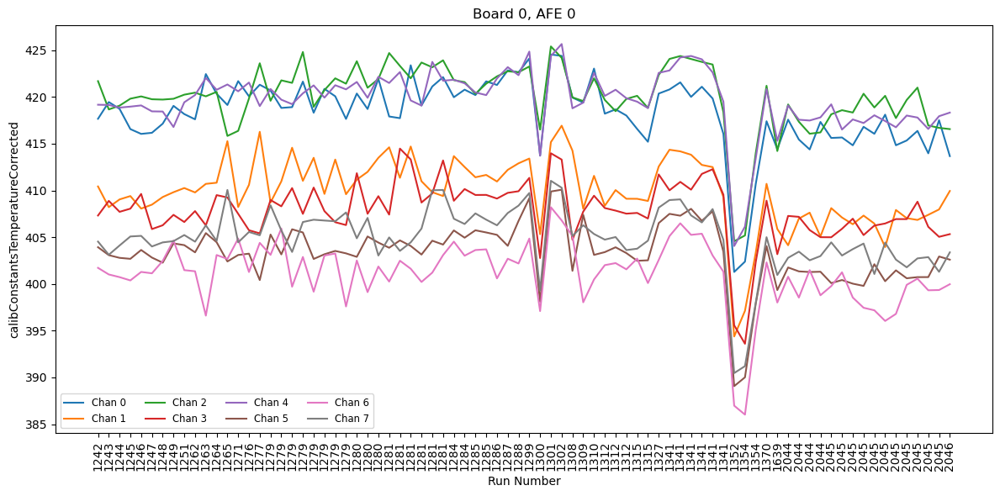

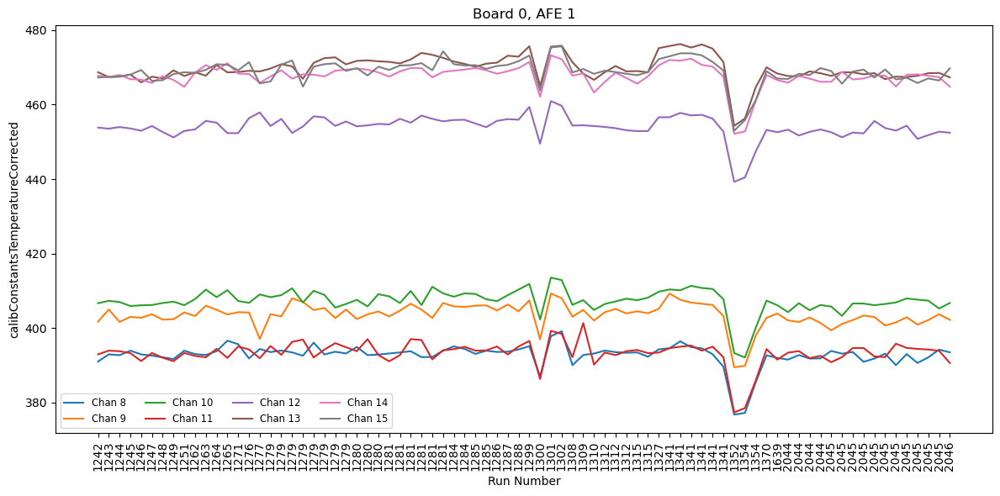

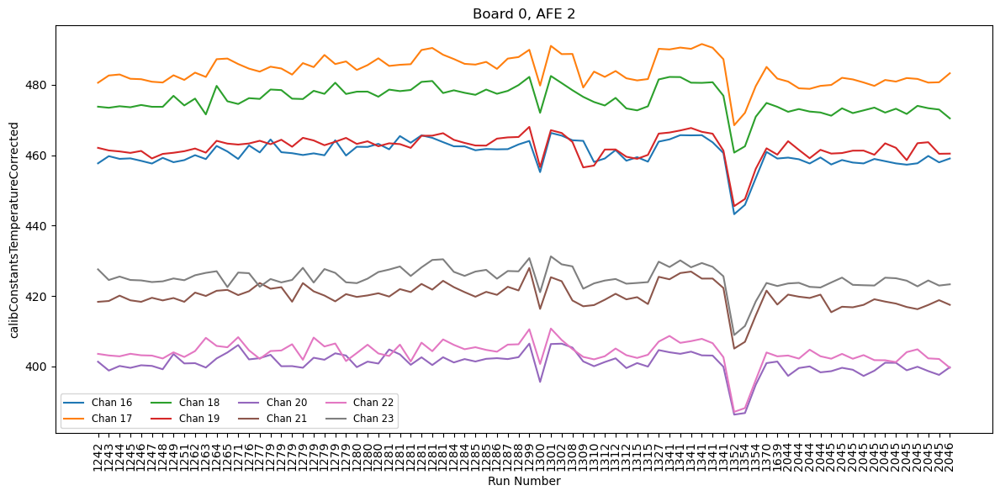

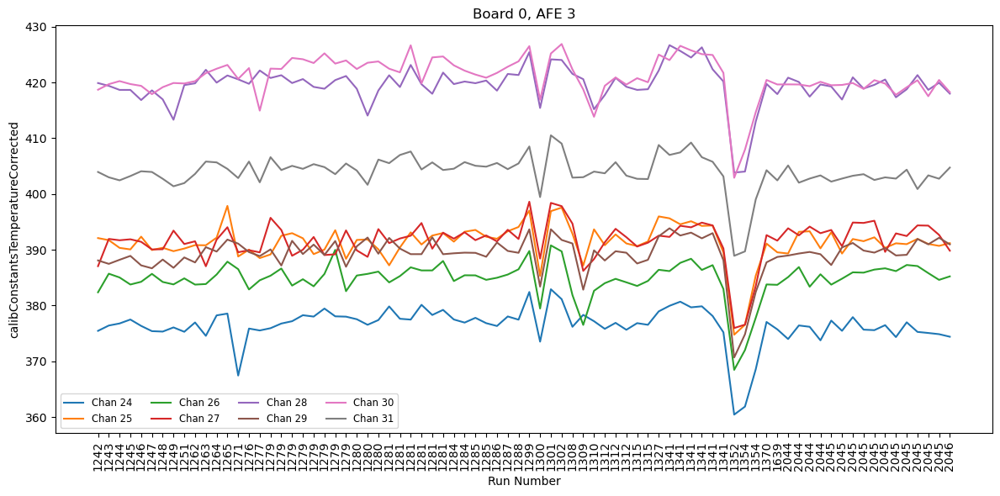

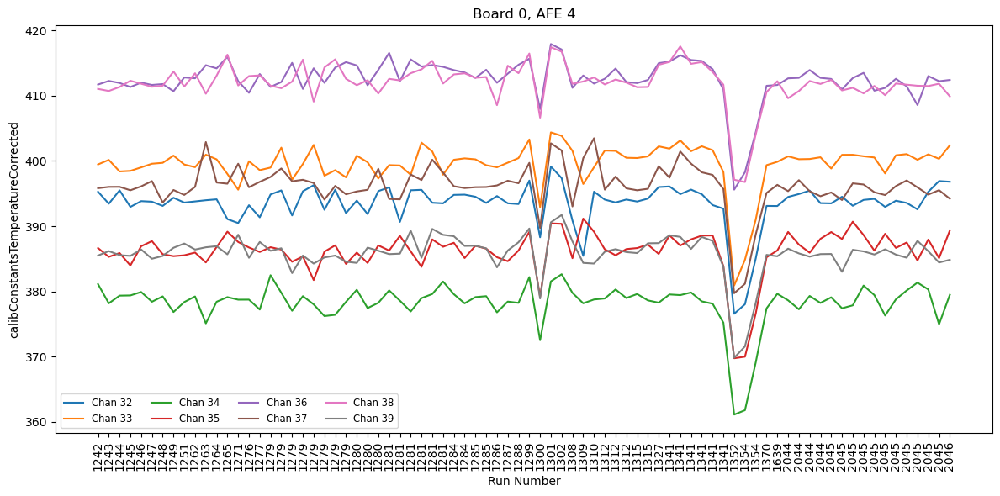

...

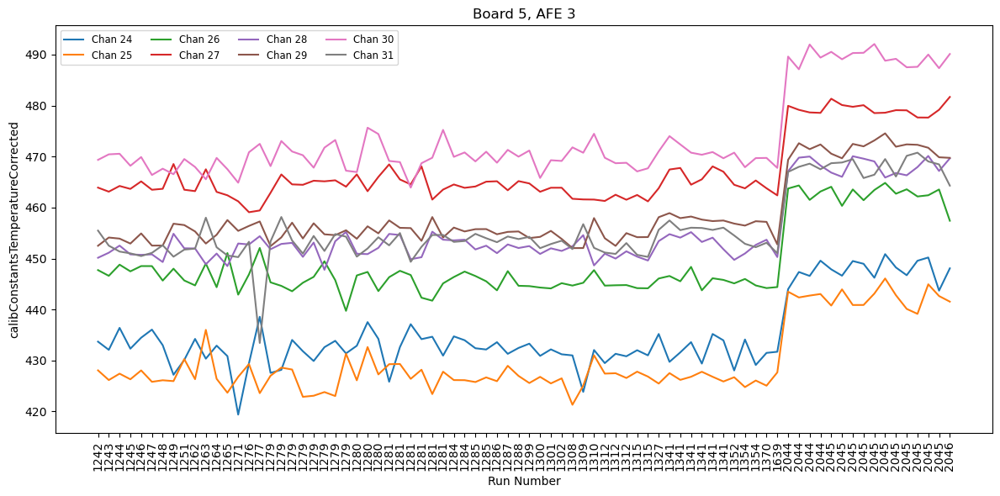

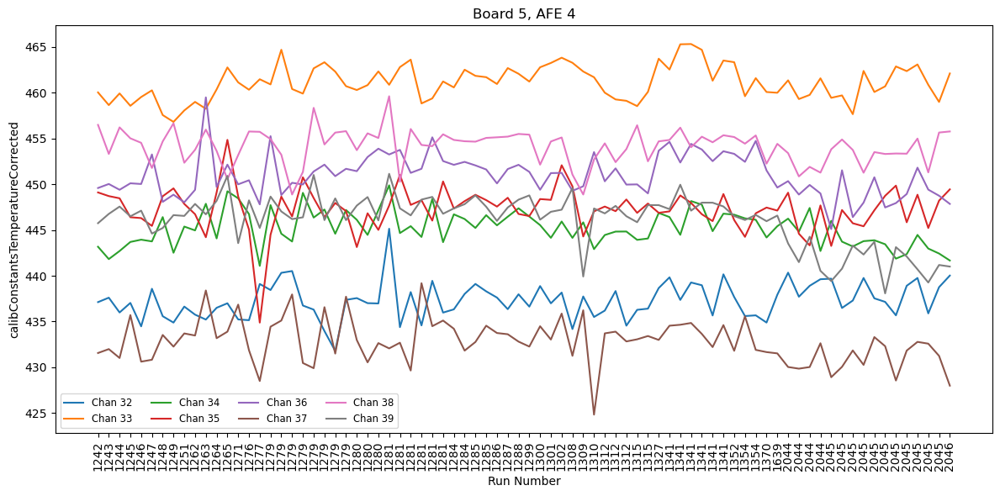

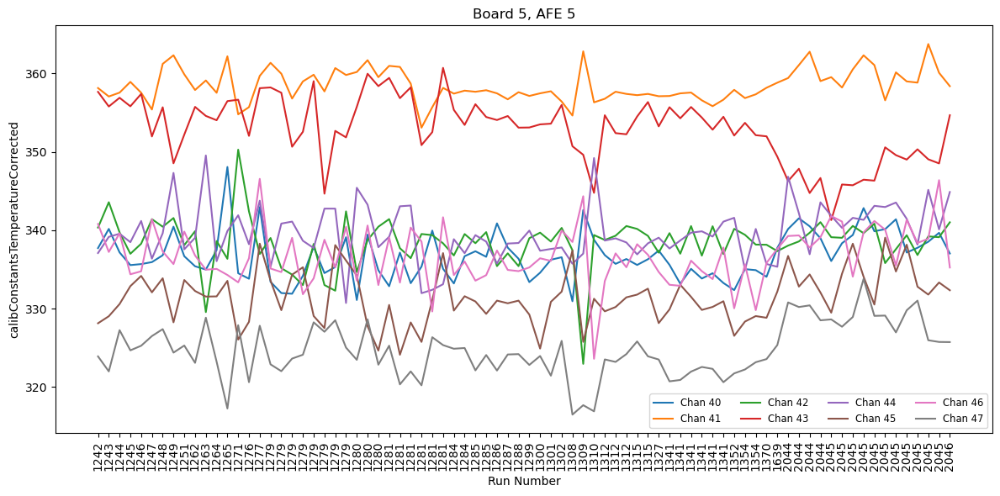

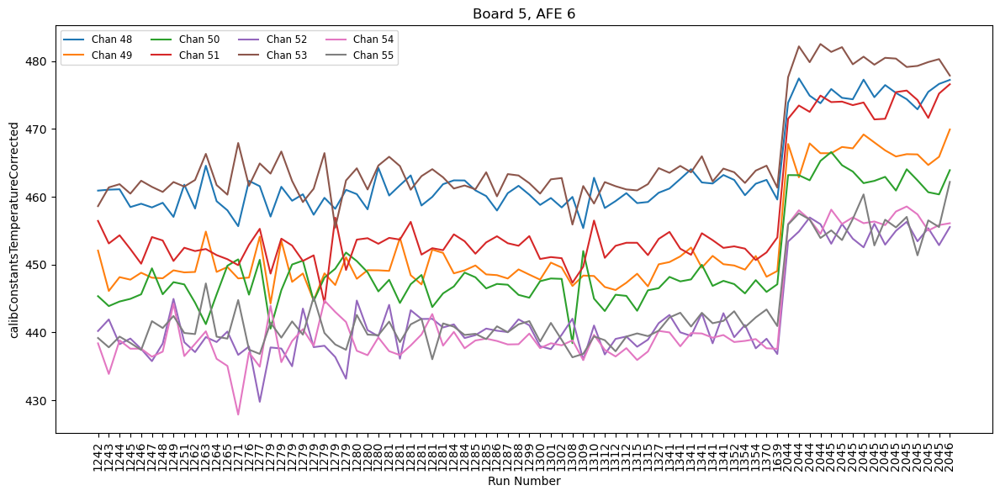

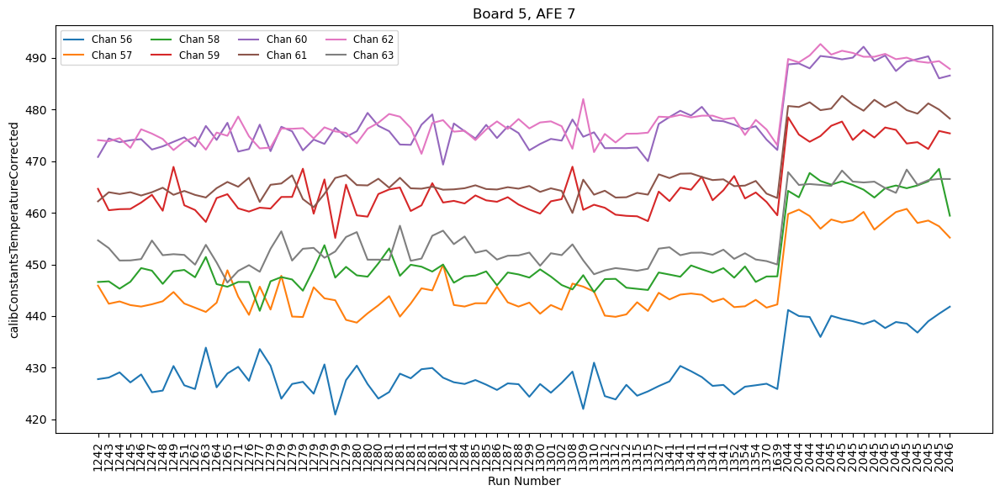

In [329]:
x = np.arange(len(ar_['runNumber']))  # Original spacing (0,1,2...)

for board in range(6):
    mean_vals = ak.mean(ar_['calibConstantsTemperatureCorrected'][:, board, :], axis=0)
    result = ar_['calibConstantsTemperatureCorrected'][:, board, :]

    for afe in range(8):
        plt.figure(figsize=(12, 6))
        
        for chan in range(8):
            plt.plot(x, result[:, afe*8 + chan], "-", label=f"Chan {afe*8 + chan}")

        plt.xticks(ticks=x, labels=ar_['runNumber'], rotation=90)
        plt.title(f"Board {board}, AFE {afe}")
        plt.legend(fontsize='small', ncol=4)
        plt.ylabel("calibConstantsTemperatureCorrected")
        plt.xlabel("Run Number")
        plt.tight_layout()

/tmp/ipykernel_1174987/2519589512.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 640x480 with 0 Axes>

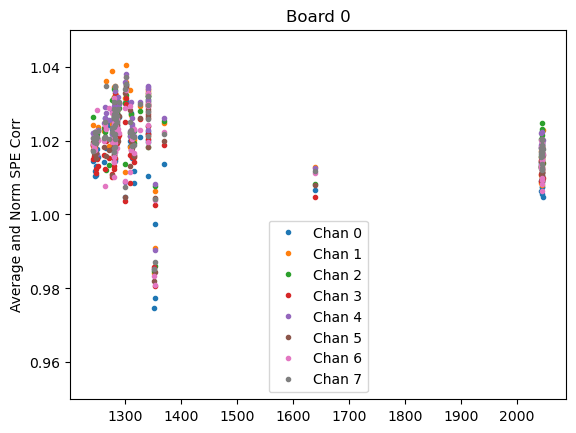

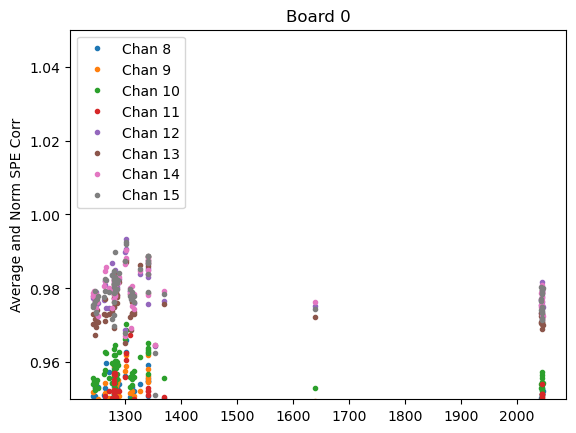

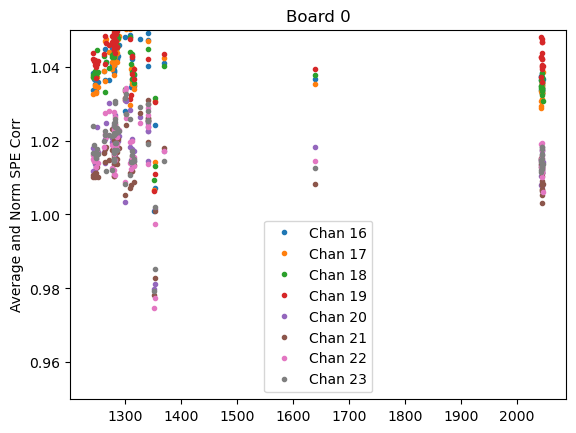

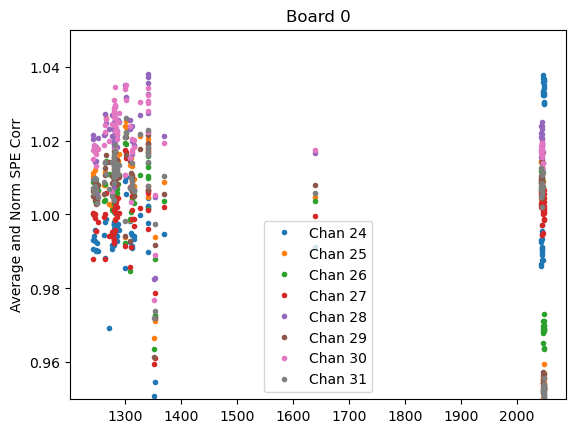

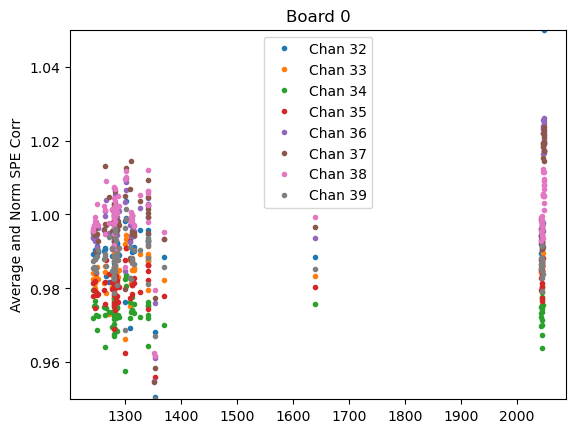

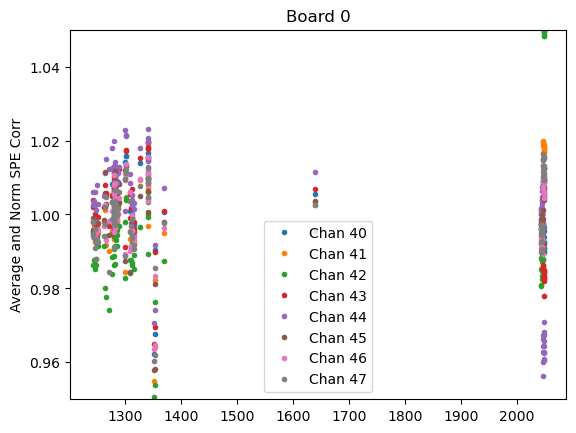

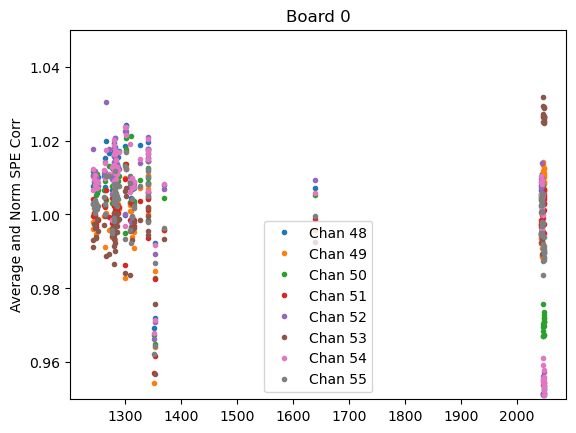

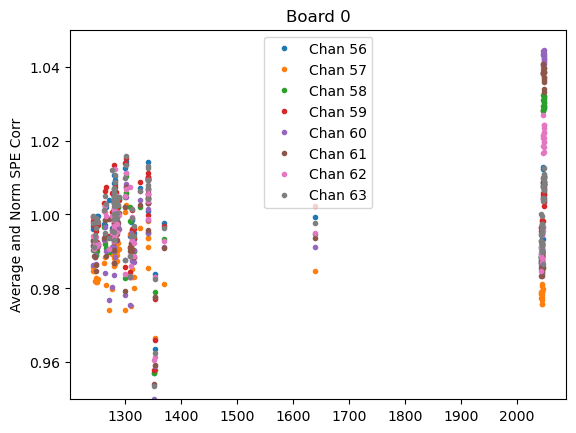

<Figure size 640x480 with 0 Axes>

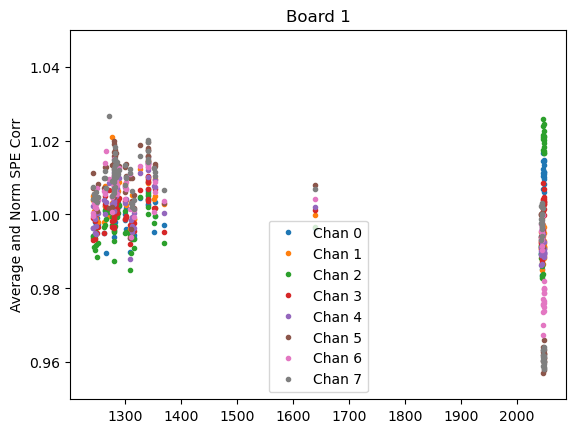

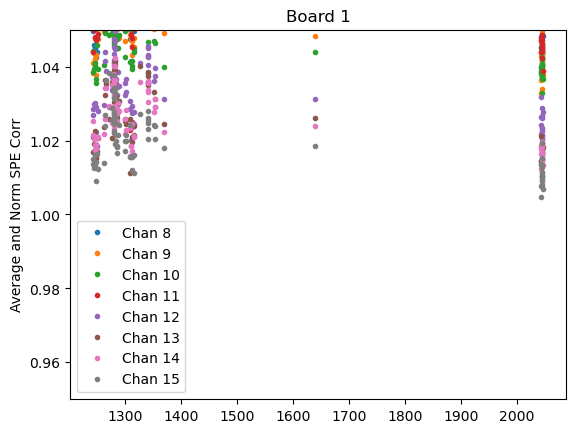

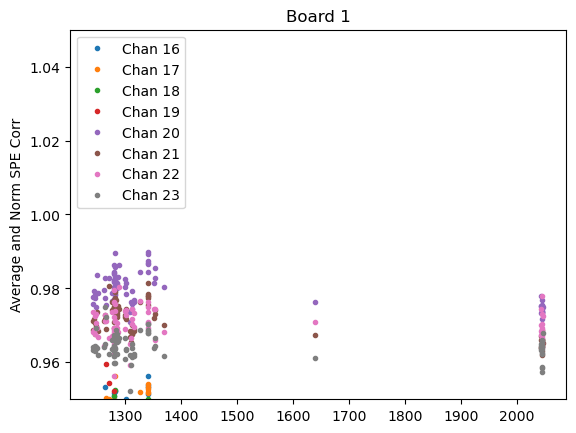

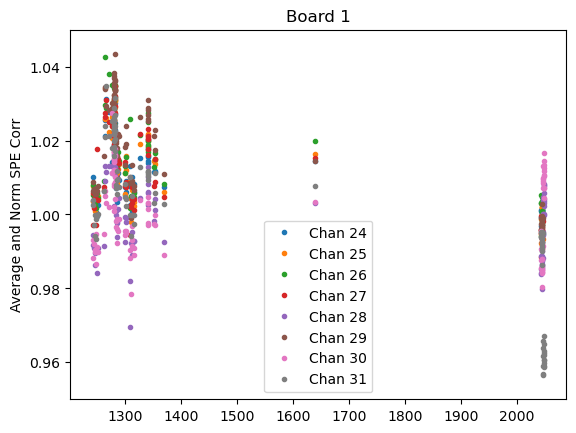

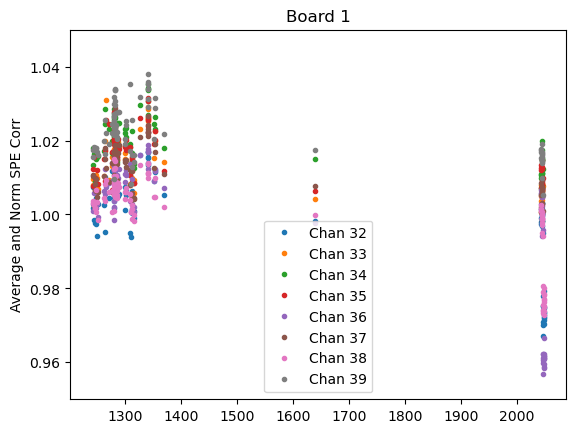

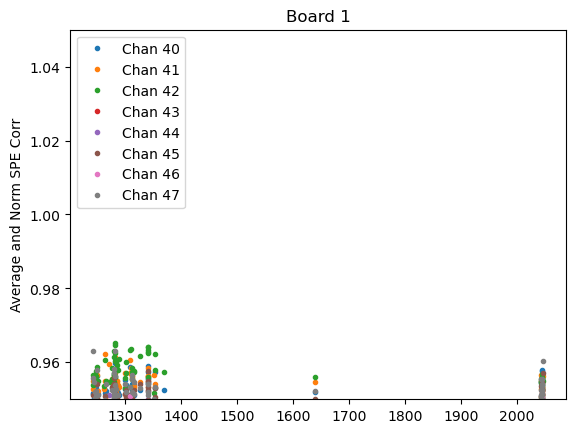

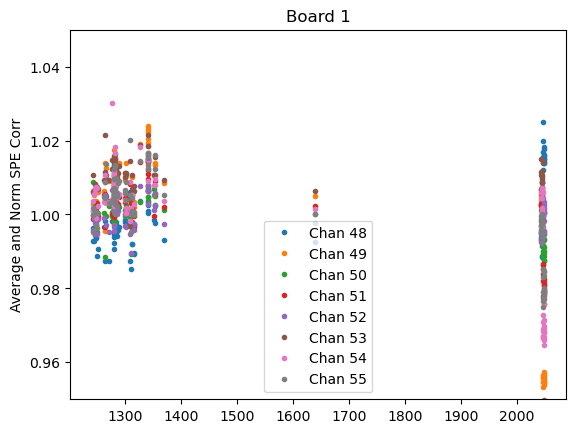

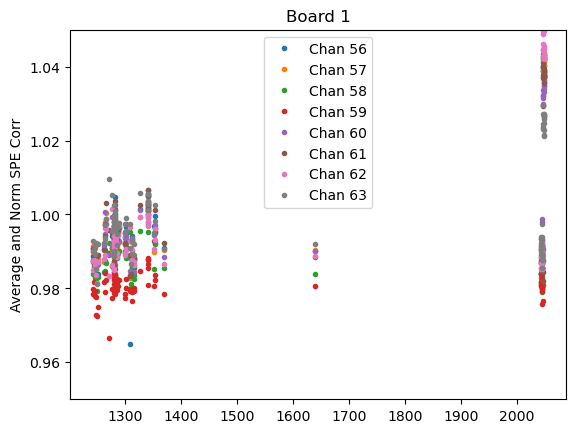

<Figure size 640x480 with 0 Axes>

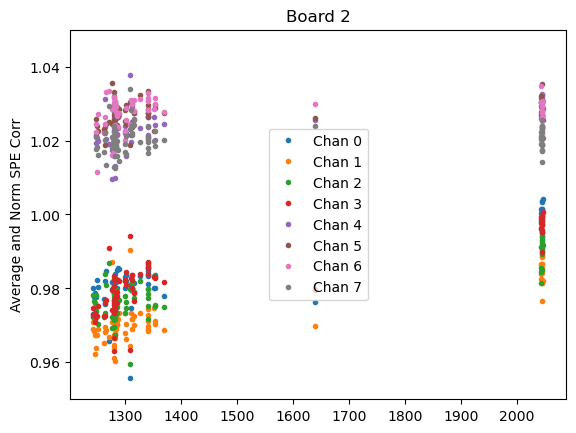

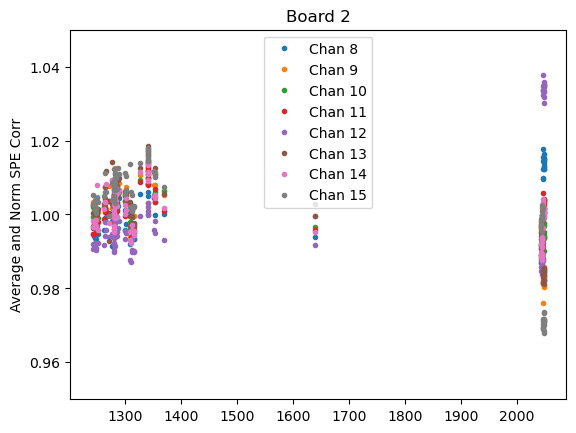

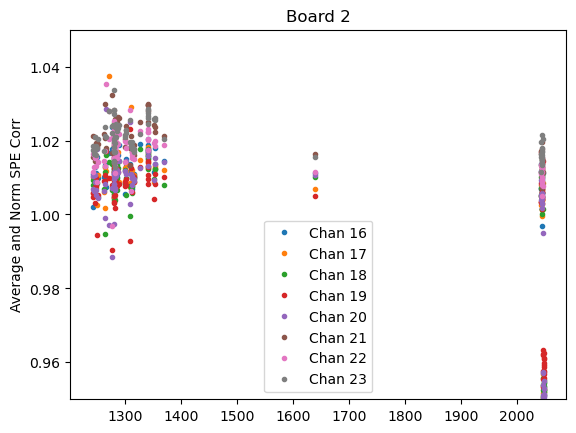

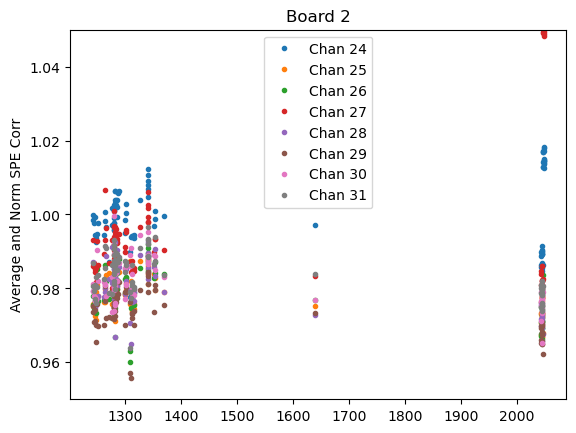

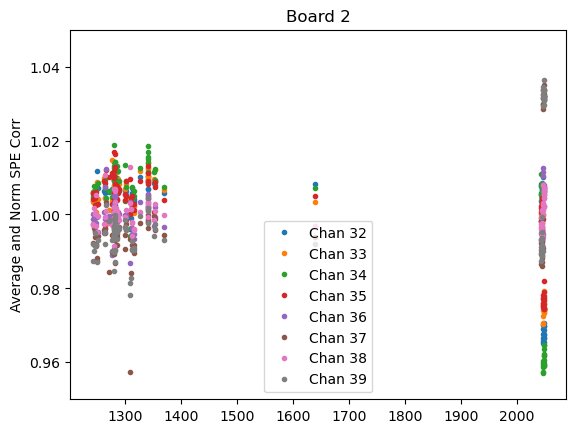

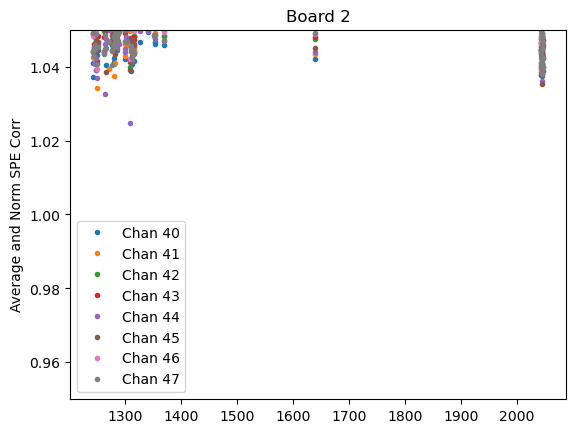

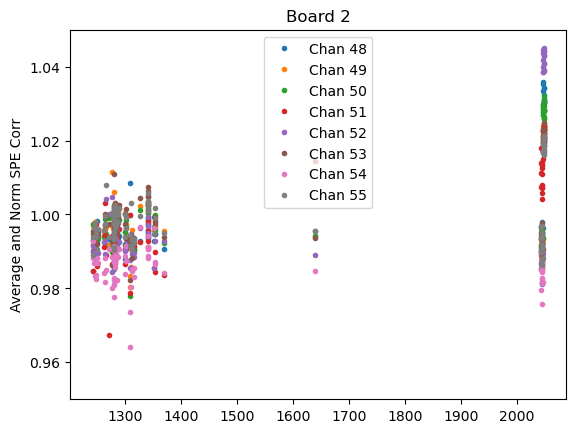

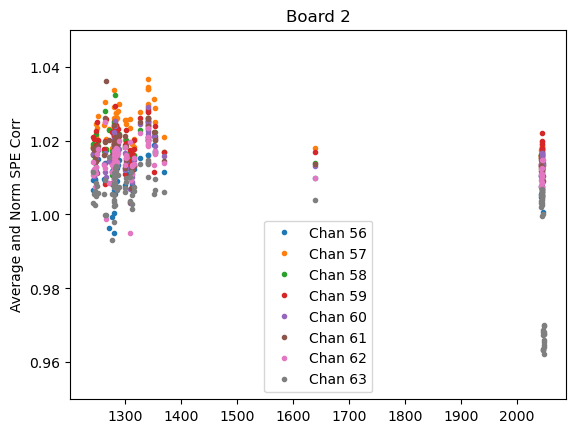

<Figure size 640x480 with 0 Axes>

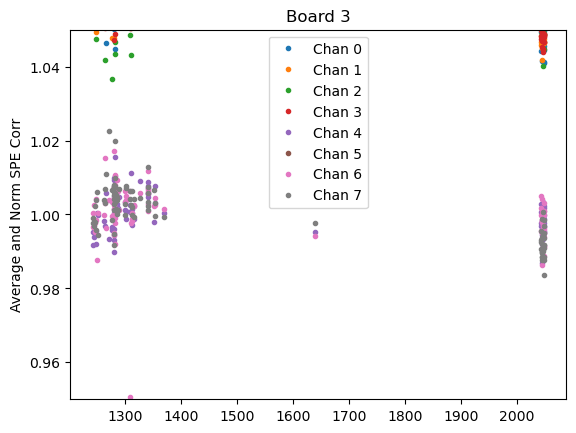

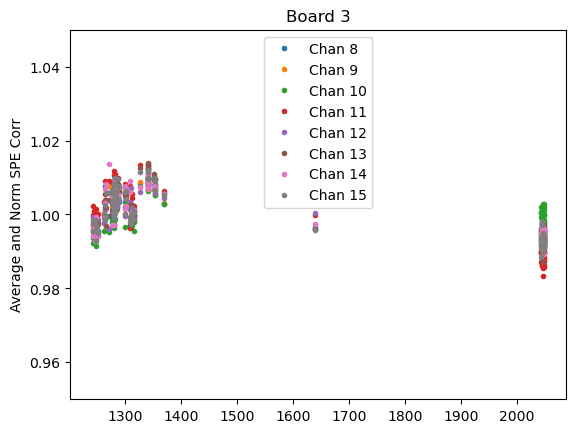

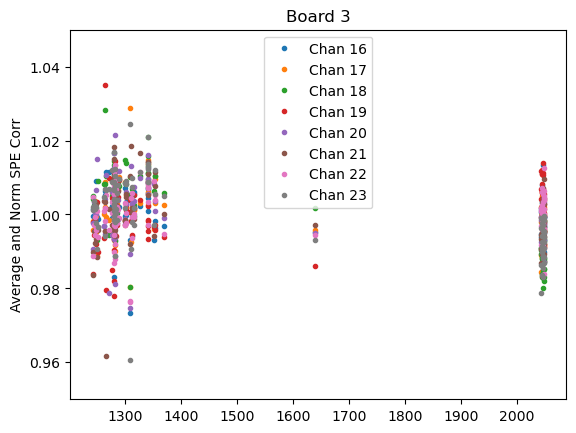

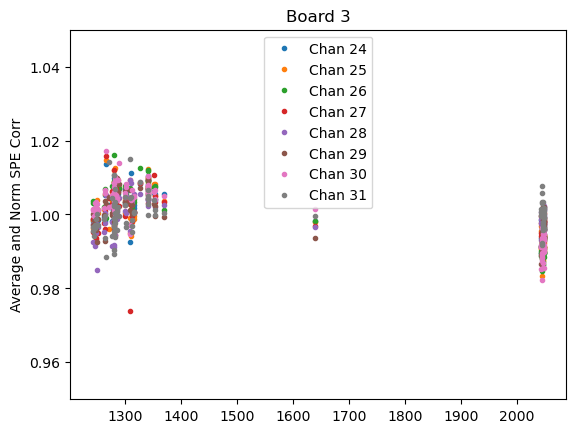

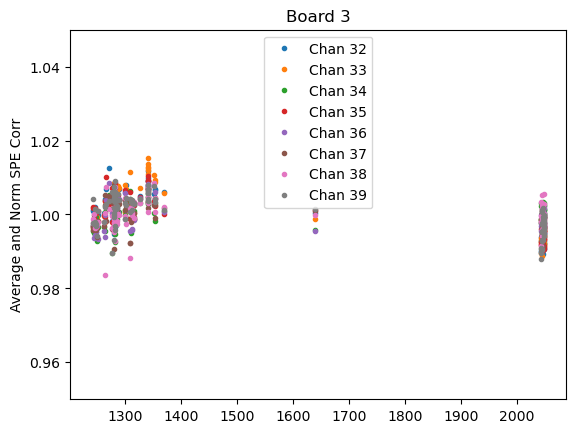

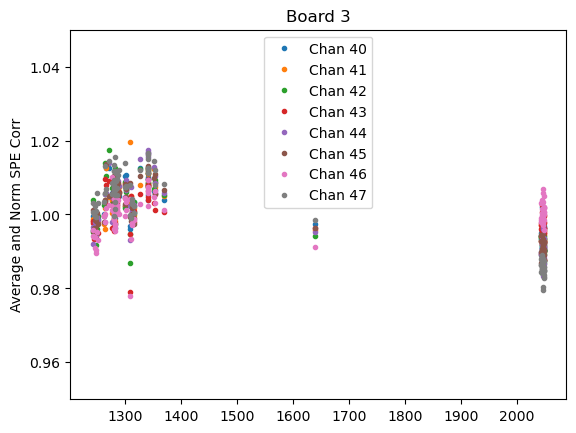

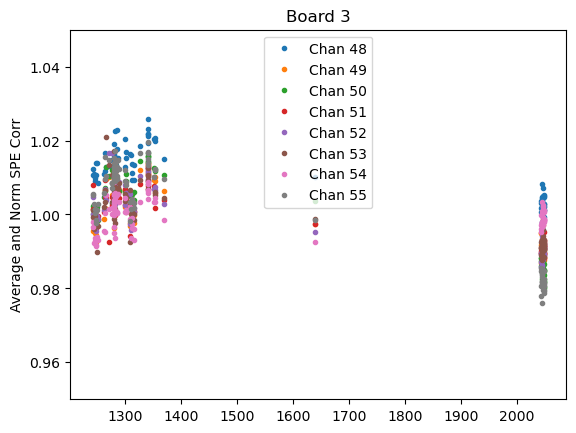

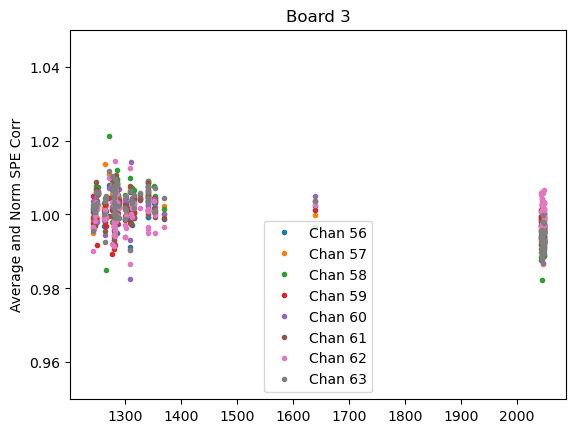

<Figure size 640x480 with 0 Axes>

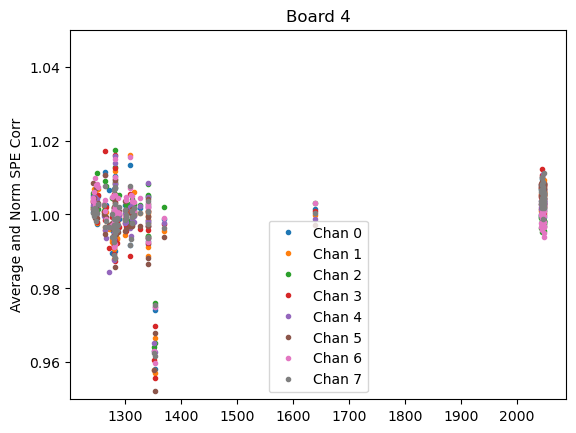

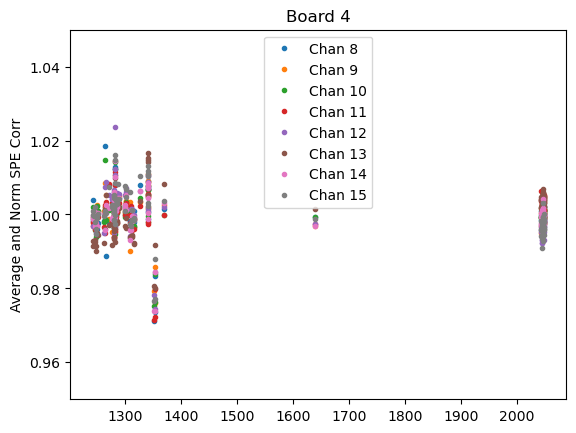

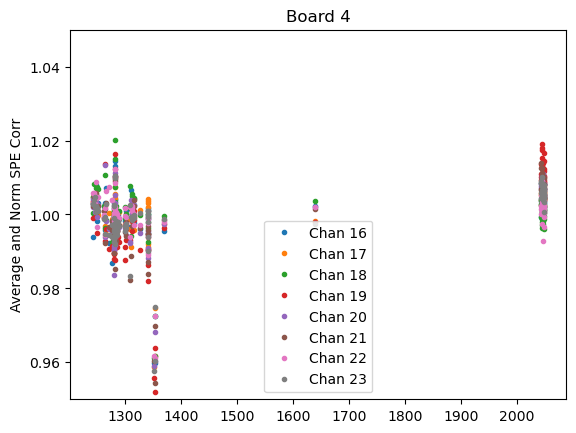

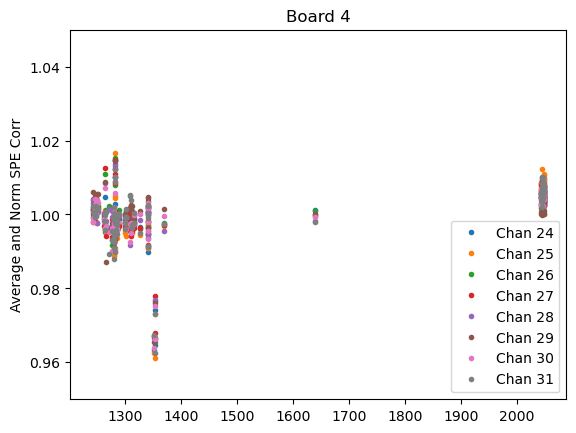

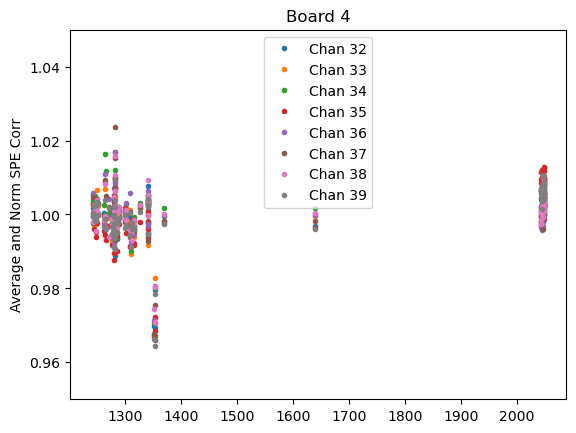

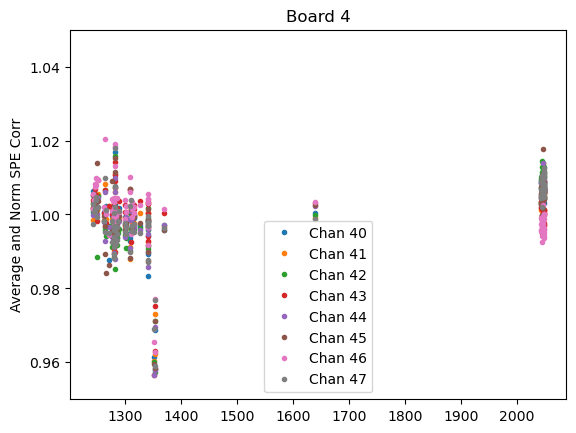

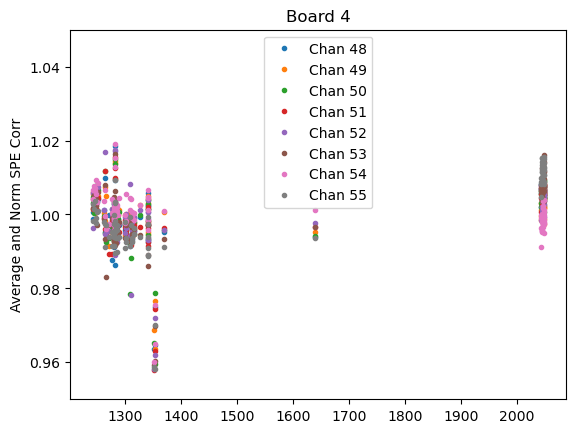

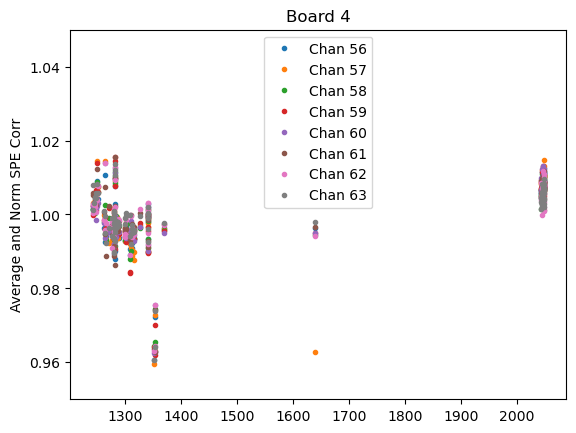

<Figure size 640x480 with 0 Axes>

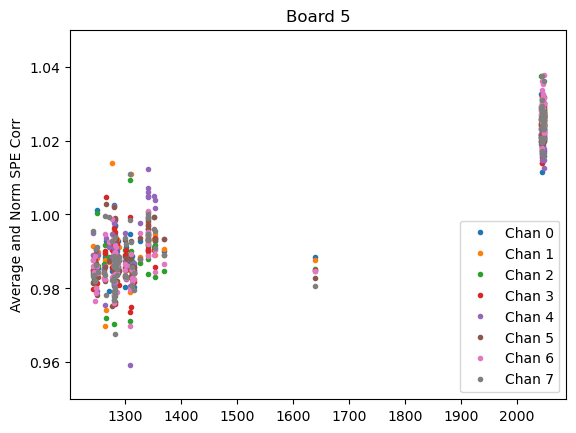

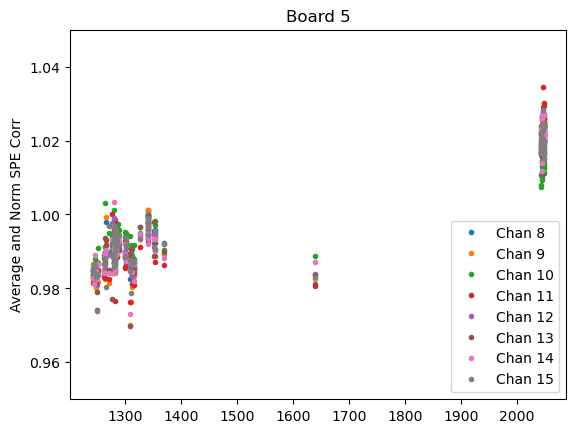

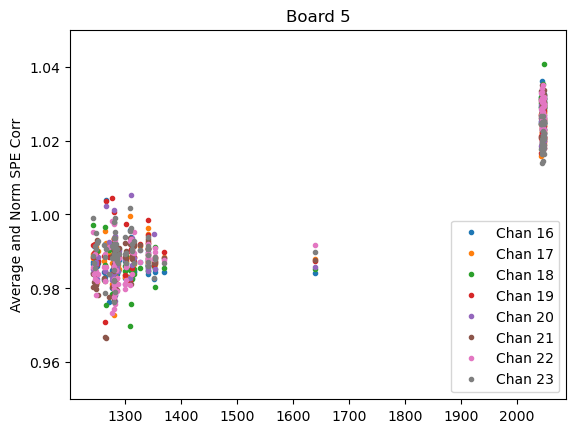

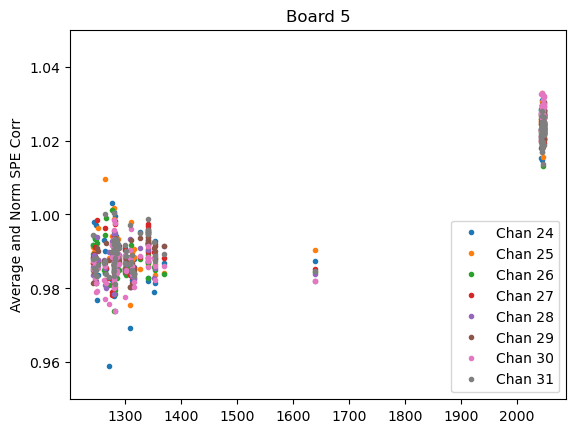

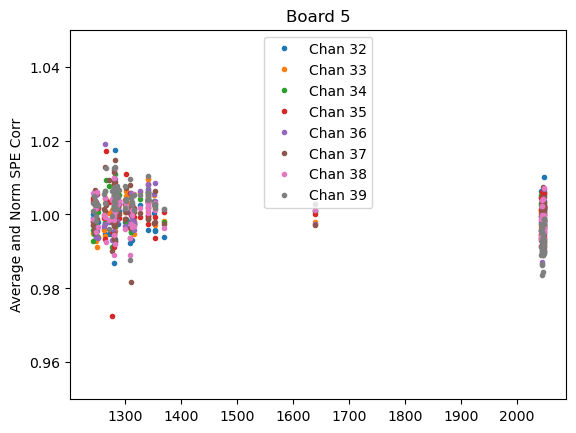

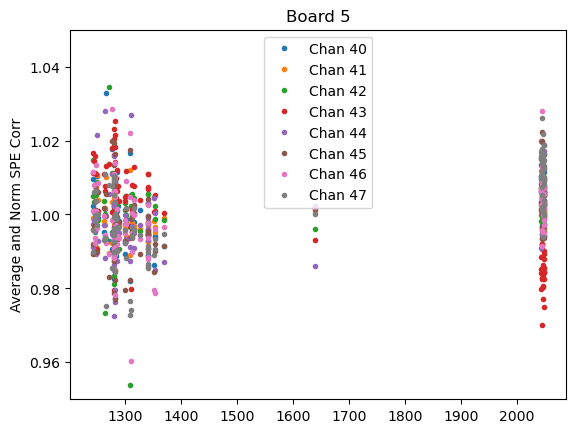

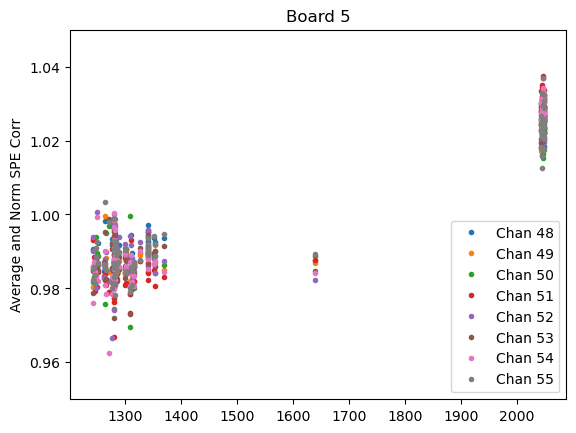

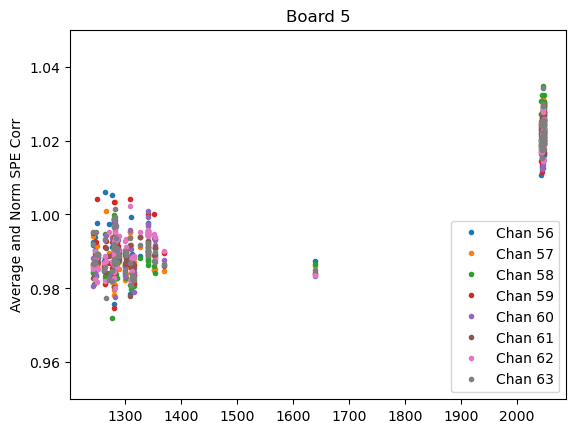

In [330]:
for board in range(0,6):
    plt.figure()
    mean_vals = ak.mean(ar['calibConstantsTemperatureCorrected'][:, board, :], axis=0)
    result = ar['calibConstantsTemperatureCorrected'][:, board, :] / mean_vals
    for afe in range(0,8):
        plt.figure()
        for chan in range(0,8):
            plt.plot(ar['runNumber'], result[:,afe*8+chan], ".", label="Chan %d"%(afe*8+chan));
            plt.ylim(0.95, 1.05)
            plt.title("Board %d"%board)
            plt.legend()
            plt.ylabel("Average and Norm SPE Corr");

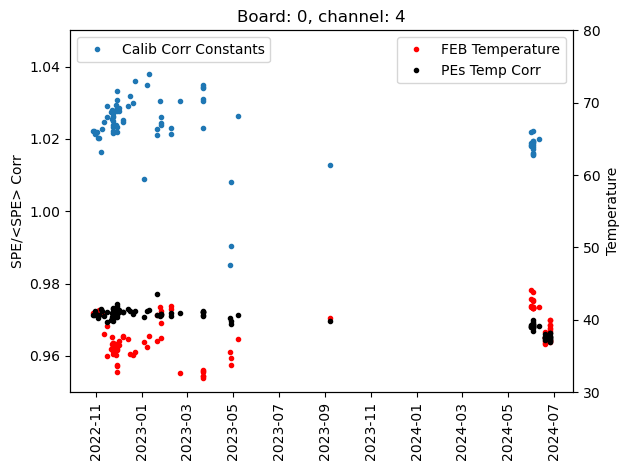

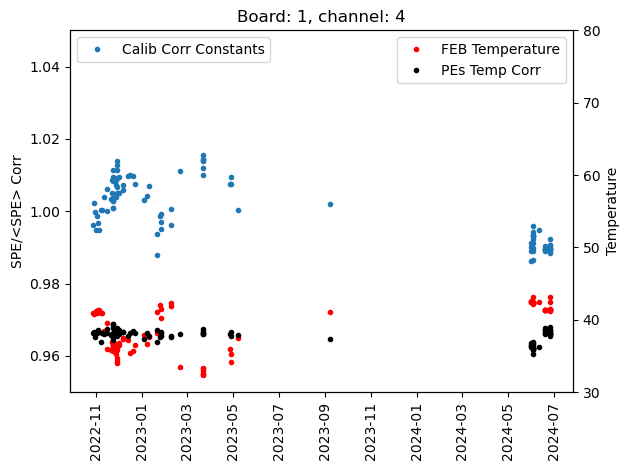

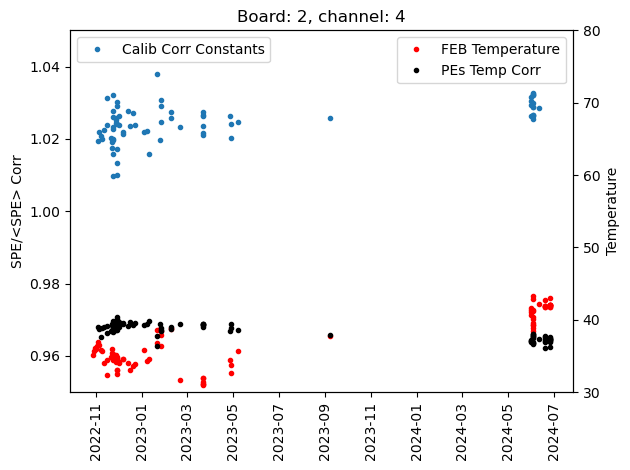

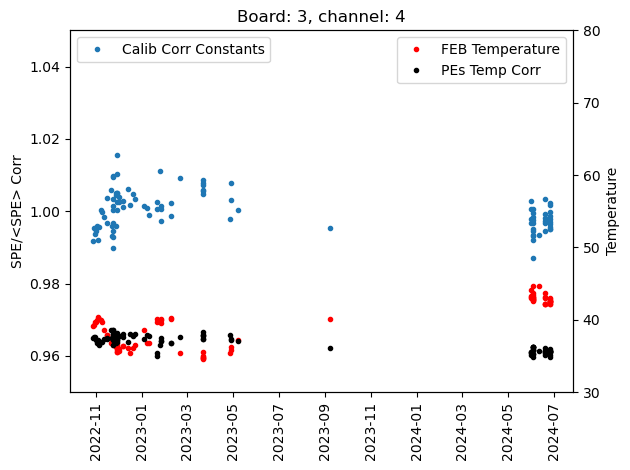

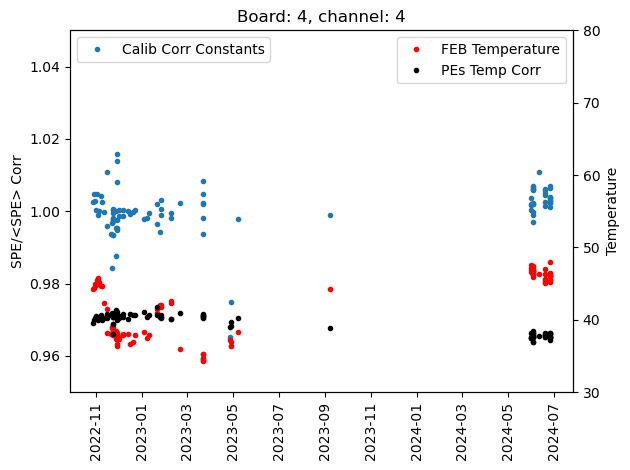

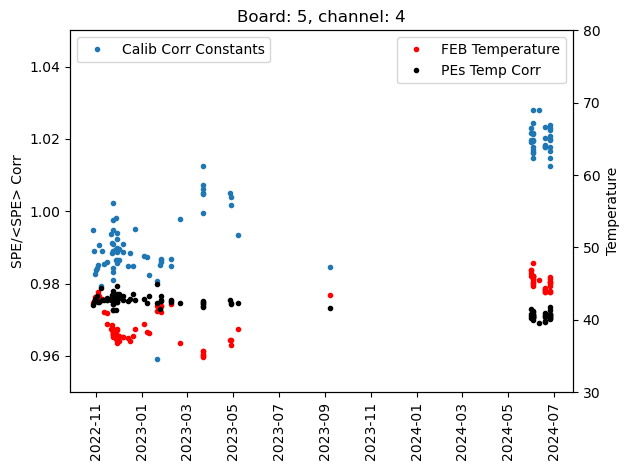

In [331]:
for board in range(0, 6):
    channel = 4
    fig, ax1 = plt.subplots()

    # Define your cut condition
#    cut = (ar['timestamp'] > 0) & (ar['runNumber'] < 1300)
    cut = (ar['timestamp'] > 0) & (ar['runNumber'] > 1176)
#    cut = (ar['timestamp'] > 0)
    x = ar['runNumber'][cut].to_numpy()
    x = ar['timestamp'][cut].to_numpy()
    
    # Primary axis data: SPE-related quantities
    y_temp_corr = ar['calibConstantsTemperatureCorrected'][cut][:, board, channel].to_numpy()
    y_temp_corr = y_temp_corr/y_temp_corr.mean()

    y_calib = ar['calibConstants'][cut][:, board, channel].to_numpy()

#    ax1.plot(x, y_temp_corr, '.', label='Calib Temp Corrected')
    ax1.plot(x.astype('datetime64[s]'), y_temp_corr, '.', label='Calib Corr Constants')

#    ax1.plot(x, y_calib, '.', label='Calib Constants')
#    ax1.plot(x.astype('datetime64[s]'), y_calib, '.', label='Calib Constants')
    ax1.set_ylabel('SPE/<SPE> Corr')
    ax1.set_ylim(0.95, 1.05)
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_title("Board: %d, channel: %d" % (board, channel))
    ax1.legend(loc='upper left')

    # Secondary axis: FEB temperature data
    ax2 = ax1.twinx()
    # Adjust indexing to match your data structure; here assuming similar syntax
    y_temp = ar['febTemperaturesAvg'][cut][:, board].to_numpy()
#    ax2.plot(x, y_temp, '.', color='red', label='FEB Temperature')
    ax2.plot(x.astype('datetime64[s]'), y_temp, '.', color='red', label='FEB Temperature')

    y_pe_calib = ar['PEsTemperatureCorrected'][cut][:, board, channel].to_numpy()
    ax2.plot(x.astype('datetime64[s]'), y_pe_calib, '.', color='black', label='PEs Temp Corr')
    ax2.set_ylabel('Temperature')
    ax2.set_ylim(30, 80)
    ax2.legend()

    # Optional: combine legends if needed, or keep separate.
    fig.tight_layout()    

Temperature at CMB vs time

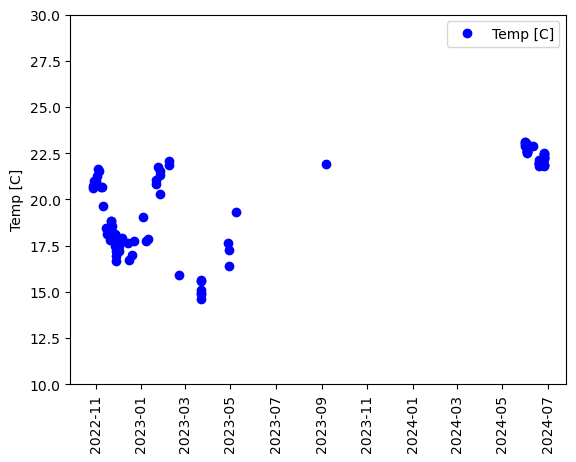

In [332]:
cut = (ar['timestamp'] > 0)
x=ar["timestamp", cut].to_numpy()
y=ar["meanTemperatures", cut][:,1,0].to_numpy()
    
plt.plot(x.astype('datetime64[s]'), y, 'bo', label='Temp [C]')
plt.xticks(rotation=90);
plt.ylim(10, 30)
plt.ylabel('Temp [C]')
plt.legend();

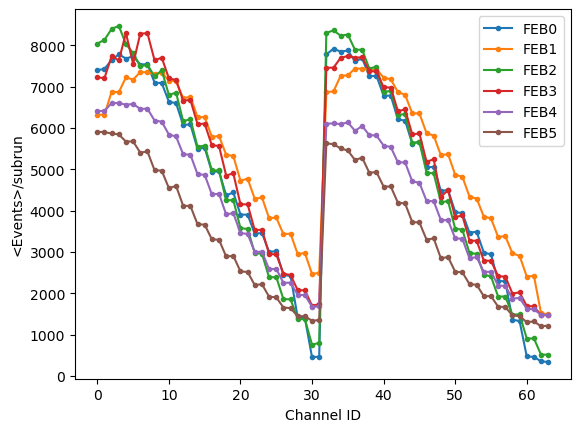

In [333]:
for feb in range(NFEBS):
    plt.plot(ak.mean(ar['signals'][:,feb,:], axis=0), '.-', label='FEB%d'%feb);
plt.ylabel('<Events>/subrun')
plt.xlabel('Channel ID')
plt.legend();

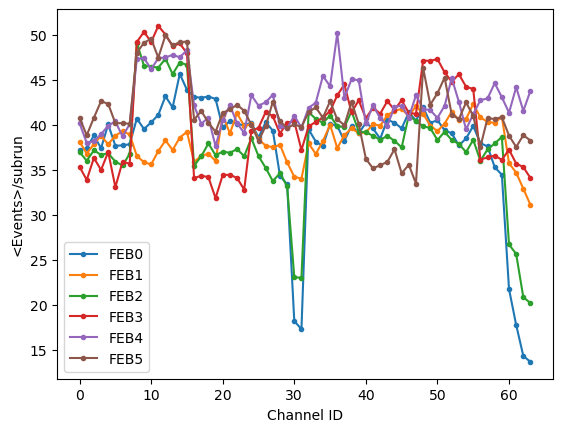

In [334]:
for feb in range(NFEBS):
    plt.plot(ak.mean(ar['PEs'][:,feb,:], axis=0), '.-', label='FEB%d'%feb);
plt.ylabel('<Events>/subrun')
plt.xlabel('Channel ID')
plt.legend();

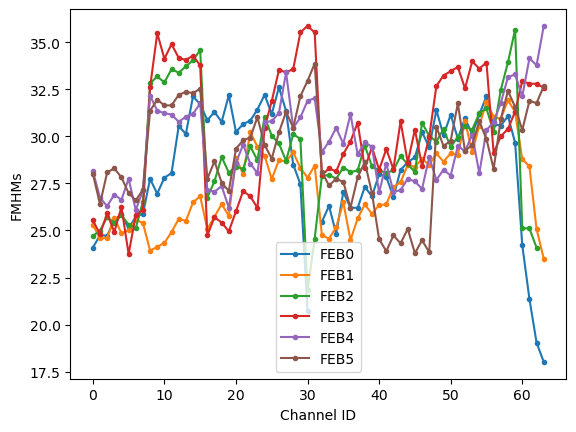

In [335]:
for feb in range(NFEBS):
    plt.plot(ak.mean(ar['FWHMs'][:,feb,:], axis=0), '.-', label='FEB%d'%feb);
plt.ylabel('FMHMs')
plt.xlabel('Channel ID')
plt.legend();